# 1 - Data Analysis and Preprocessing
Major activities performed in this section are:
1.	Handle Missing Values
2.	Data Cleaning
3.	Exploratory Data Analysis (EDA)
4.	Merge Datasets for Geolocation Analysis
5.	Feature Engineering
6.	Data Transformations

In [ ]:
# import dependencies 
import pandas as pd  
import seaborn as sns
import matplotlib.pyplot as plt
import os
import sys
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))


# Import the module function from the src

In [5]:

from src.data_preprocessing import (
    handle_missing_values,
    clean_data,
    perform_eda,
    merge_datasets,
    engineer_features,
    transform_data
)

## Data loading and Understanding 

In [6]:
Fraud_df=pd.read_csv('F:/Detection-of-fraud-cases-for-e-commerce-and-bank-transactions/data/raw/Fraud_Data.csv')
Fraud_df.head()

,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class
0,22058,2015-02-24 22:55:49,2015-04-18 02:47:11,34,QVPSPJUOCKZAR,SEO,Chrome,M,39,7.327584e+08,0
1,333320,2015-06-07 20:39:50,2015-06-08 01:38:54,16,EOGFQPIZPYXFZ,Ads,Chrome,F,53,3.503114e+08,0
2,1359,2015-01-01 18:52:44,2015-01-01 18:52:45,15,YSSKYOSJHPPLJ,SEO,Opera,M,53,2.621474e+09,1
3,150084,2015-04-28 21:13:25,2015-05-04 13:54:50,44,ATGTXKYKUDUQN,SEO,Safari,M,41,3.840542e+09,0
4,221365,2015-07-21 07:09:52,2015-09-09 18:40:53,39,NAUITBZFJKHWW,Ads,Safari,M,45,4.155831e+08,0


In [15]:
IP_df=pd.read_csv('F:/Detection-of-fraud-cases-for-e-commerce-and-bank-transactions/data/raw/IpAddress_to_Country.csv')
IP_df.head()

,lower_bound_ip_address,upper_bound_ip_address,country
0,16777216.0,16777471,Australia
1,16777472.0,16777727,China
2,16777728.0,16778239,China
3,16778240.0,16779263,Australia
4,16779264.0,16781311,China


In [17]:
Creditcard_df=pd.read_csv('F:/Detection-of-fraud-cases-for-e-commerce-and-bank-transactions/data/raw/creditcard.csv')
Creditcard_df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [12]:
# Data types 
print("Data types of the columns:")
print(Fraud_df.dtypes)

Data types of the columns:
user_id             int64
signup_time        object
purchase_time      object
purchase_value      int64
device_id          object
source             object
browser            object
sex                object
age                 int64
ip_address        float64
class               int64
dtype: object


In [14]:
# statistics summary
print("Statistics Summary:")
print("======================================================================================")
print(Fraud_df.describe())
print("======================================================================================")

Statistics Summary:
             user_id  purchase_value            age    ip_address  \
count  151112.000000   151112.000000  151112.000000  1.511120e+05   
mean   200171.040970       36.935372      33.140704  2.152145e+09   
std    115369.285024       18.322762       8.617733  1.248497e+09   
min         2.000000        9.000000      18.000000  5.209350e+04   
25%    100642.500000       22.000000      27.000000  1.085934e+09   
50%    199958.000000       35.000000      33.000000  2.154770e+09   
75%    300054.000000       49.000000      39.000000  3.243258e+09   
max    400000.000000      154.000000      76.000000  4.294850e+09   

               class  
count  151112.000000  
mean        0.093646  
std         0.291336  
min         0.000000  
25%         0.000000  
50%         0.000000  
75%         0.000000  
max         1.000000  


In [ ]:
print("Missing values  Fraud per column:")
Fraud_df = handle_missing_values(Fraud_df)
print('================================')
print("Missing values Ip Address per  column:")
IP_df = handle_missing_values(IP_df)
print('================================')
print("Missing values  of credit card per column:")
Creditcard_df = handle_missing_values(Creditcard_df)
print('================================')

Missing values per Fraud column:
Missing values per Ip Address column:
Missing values per column:


In [ ]:

Fraud_data = clean_data(Fraud_df)


In [20]:

fraud_data = perform_eda(Fraud_df)


Univariate Analysis:
user_id: Mean=200171.04, Std=115369.29, Min=2, Max=400000
signup_time: {'2015-02-24 22:55:49': 1, '2015-06-07 20:39:50': 1, '2015-01-01 18:52:44': 1, '2015-04-28 21:13:25': 1, '2015-07-21 07:09:52': 1, '2015-05-21 06:03:03': 1, '2015-08-01 22:40:52': 1, '2015-04-06 07:35:45': 1, '2015-04-21 23:38:34': 1, '2015-01-25 17:49:49': 1, '2015-07-11 18:26:54': 1, '2015-05-29 16:22:02': 1, '2015-06-16 21:19:35': 1, '2015-03-03 19:17:07': 1, '2015-02-16 02:50:30': 1, '2015-02-01 01:06:17': 1, '2015-05-15 03:52:08': 1, '2015-03-20 00:31:27': 1, '2015-02-03 00:48:38': 1, '2015-07-17 05:48:45': 1, '2015-07-08 15:35:44': 1, '2015-08-08 20:05:50': 1, '2015-01-30 08:50:29': 1, '2015-01-08 11:47:29': 1, '2015-01-11 01:51:15': 1, '2015-01-04 22:32:33': 1, '2015-01-28 12:53:51': 1, '2015-07-12 14:14:04': 1, '2015-05-29 17:55:17': 1, '2015-01-07 03:44:53': 1, '2015-04-03 20:06:51': 1, '2015-08-05 23:50:35': 1, '2015-02-13 18:16:05': 1, '2015-01-03 03:29:05': 1, '2015-06-12 19:11:32': 

In [ ]:

fraud_data = merge_datasets(fraud_data, ip_data)
fraud_data = engineer_features(fraud_data)
X_transformed, y, preprocessor = transform_data(fraud_data, target_col='class', train=True)

# For test data (without target)
# test_data = handle_missing_values(test_data)
# test_data = clean_data(test_data)
# test_data = merge_datasets(test_data, ip_data)
# test_data = engineer_features(test_data)
# X_test_transformed, preprocessor = transform_data(test_data, train=False)

## Handling missing Values

# Data cleaning 


In [10]:
## Remove duplicate rows
df = df.drop_duplicates()

## Correct data types
# Example: Convert a column to datetime
if 'date_column' in df.columns:
    df['date_column'] = pd.to_datetime(df['date_column'], errors='coerce')

# Example: Convert a column to numeric
if 'numeric_column' in df.columns:
    df['numeric_column'] = pd.to_numeric(df['numeric_column'], errors='coerce')

# Check result
print(df.info())
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 151112 entries, 0 to 151111
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   user_id         151112 non-null  int64  
 1   signup_time     151112 non-null  object 
 2   purchase_time   151112 non-null  object 
 3   purchase_value  151112 non-null  int64  
 4   device_id       151112 non-null  object 
 5   source          151112 non-null  object 
 6   browser         151112 non-null  object 
 7   sex             151112 non-null  object 
 8   age             151112 non-null  int64  
 9   ip_address      151112 non-null  float64
 10  class           151112 non-null  int64  
dtypes: float64(1), int64(4), object(6)
memory usage: 12.7+ MB
None
   user_id          signup_time        purchase_time  purchase_value  \
0    22058  2015-02-24 22:55:49  2015-04-18 02:47:11              34   
1   333320  2015-06-07 20:39:50  2015-06-08 01:38:54              16   
2     1

In [26]:
# Set Seaborn style
import seaborn as sns
sns.set(style="whitegrid")


## ===============================
## Univariate Analysis
## ===============================

In [12]:

# ===============================
# Univariate Analysis
# ===============================

# 1. Summary statistics
print(df.describe(include='all'))


              user_id          signup_time        purchase_time  \
count   151112.000000               151112               151112   
unique            NaN               151112               150679   
top               NaN  2015-02-24 22:55:49  2015-07-17 23:22:55   
freq              NaN                    1                    3   
mean    200171.040970                  NaN                  NaN   
std     115369.285024                  NaN                  NaN   
min          2.000000                  NaN                  NaN   
25%     100642.500000                  NaN                  NaN   
50%     199958.000000                  NaN                  NaN   
75%     300054.000000                  NaN                  NaN   
max     400000.000000                  NaN                  NaN   

        purchase_value      device_id  source browser     sex            age  \
count    151112.000000         151112  151112  151112  151112  151112.000000   
unique             NaN         1379

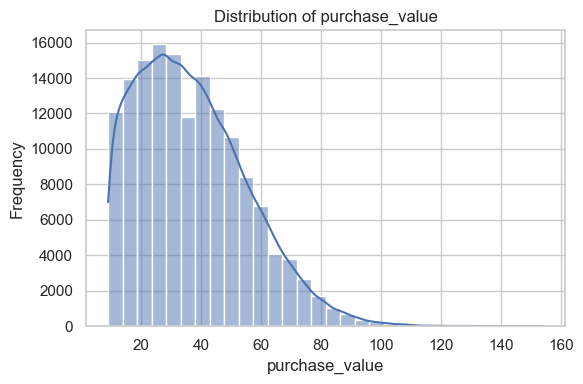

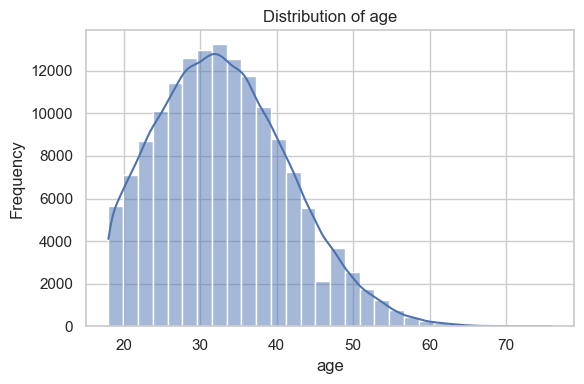

In [36]:
num_cols = ['purchase_value', 'age']

for col in num_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(Fraud_df[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

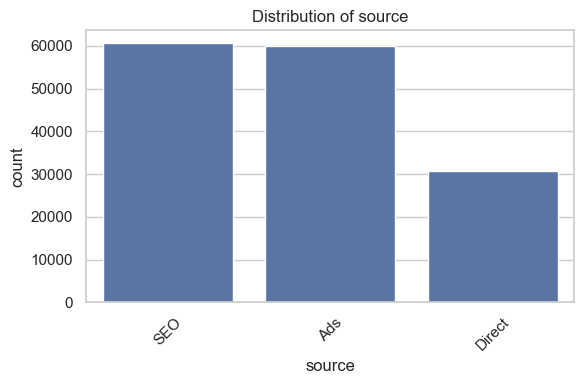

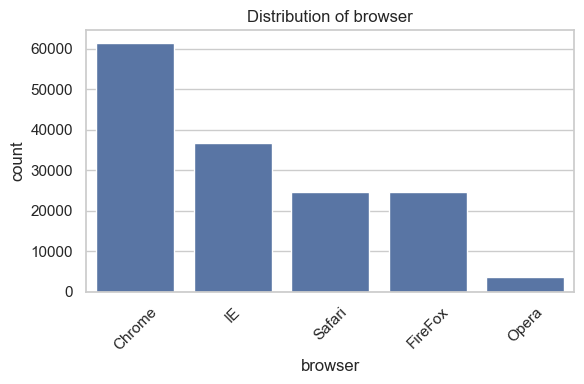

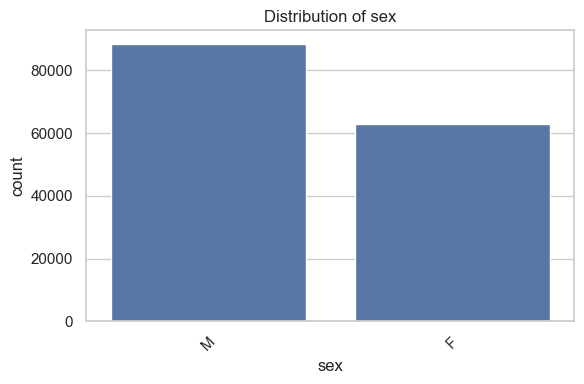

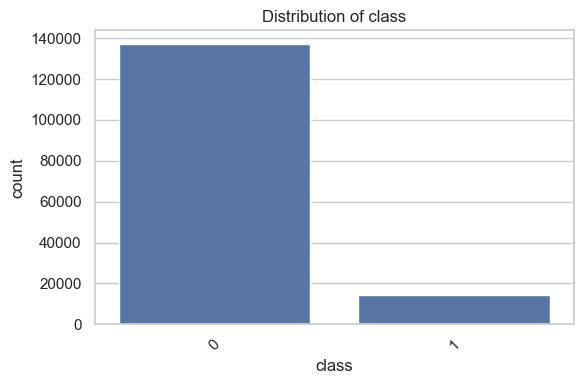

In [37]:
# --- Categorical Columns ---
cat_cols = ['source', 'browser', 'sex', 'class']

for col in cat_cols:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=col, data=Fraud_df, order=Fraud_df[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# bivarints

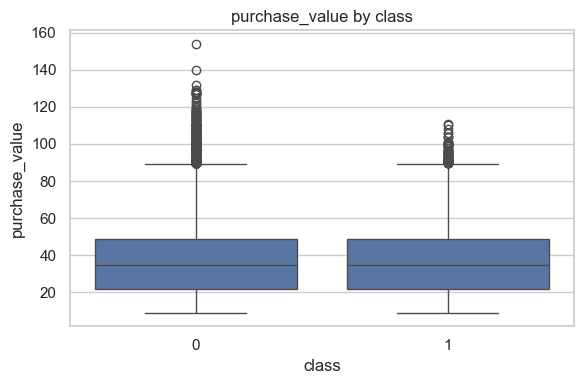

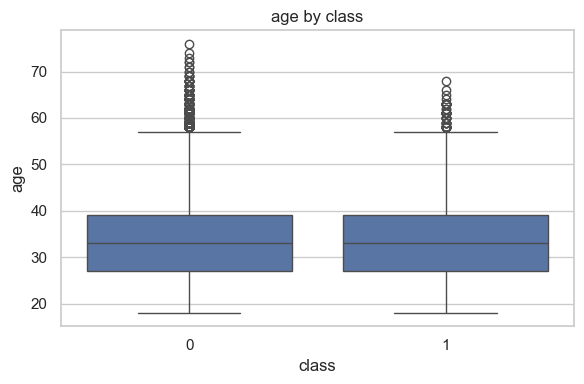

In [38]:
for col in num_cols:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x='class', y=col, data=Fraud_df)
    plt.title(f'{col} by class')
    plt.tight_layout()
    plt.show()

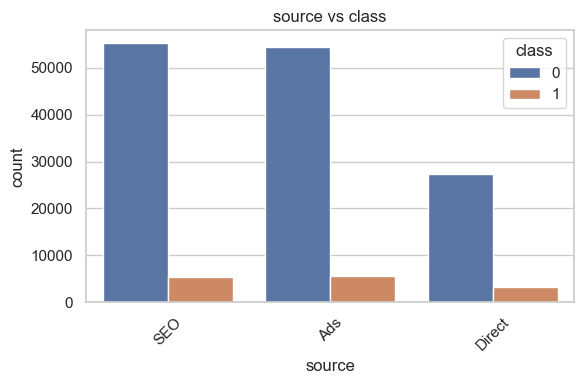

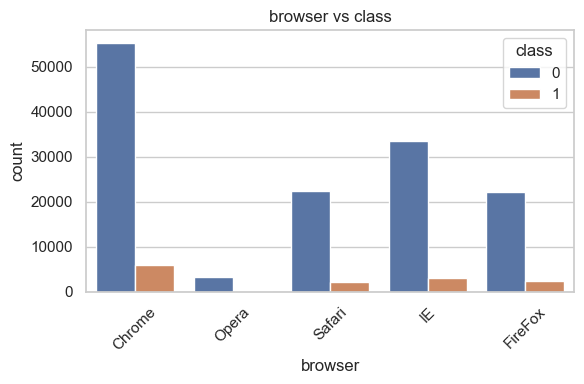

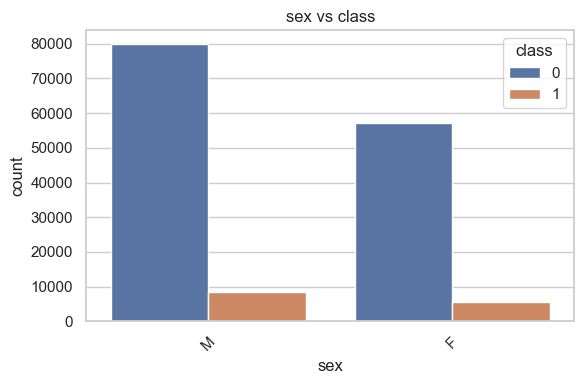

In [40]:
# Categorical vs Target (class)
for col in cat_cols:
    if col != 'class':
        plt.figure(figsize=(6, 4))
        sns.countplot(x=col, hue='class', data=Fraud_df)
        plt.title(f'{col} vs class')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()


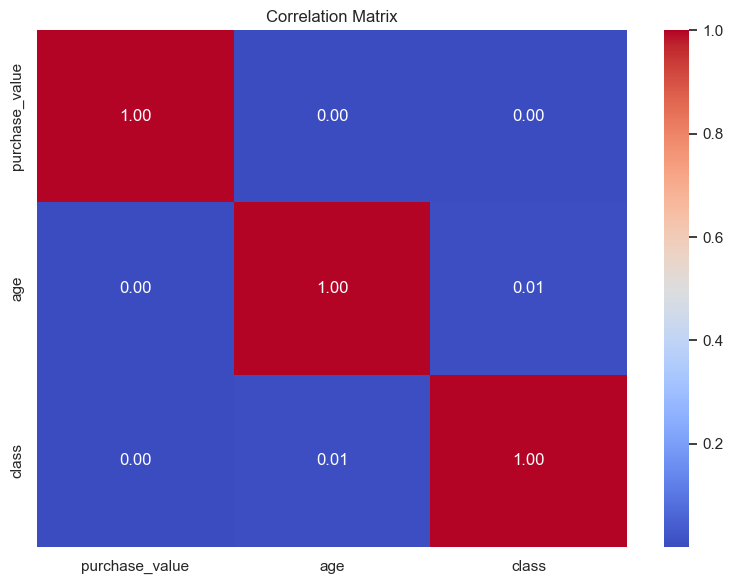

In [41]:
# Correlation Matrix (Numerical Features)

plt.figure(figsize=(8, 6))
corr = Fraud_df[num_cols + ['class']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
plt.tight_layout()
plt.show()

In [55]:
import scipy
from ydata_profiling import ProfileReport
# Create the profile
profile = ProfileReport(Fraud_df, title="Automated EDA Report", explorative=True)

# Save to file
profile.to_file("eda_report.html")

ImportError: Numba needs NumPy 2.1 or less. Got NumPy 2.3.

In [53]:
# Basic distribution
fraud_rate = Fraud_df['class'].value_counts(normalize=True)
print("Fraud Rate:\n", fraud_rate)

# Compare average purchase value
print(Fraud_df.groupby('class')['purchase_value'].describe())

# Compare age

print(Fraud_df.groupby('class')['age'].describe())

# Source comparison
print(Fraud_df.groupby('class')['source'].value_counts(normalize=True))

# Time to purchase difference
Fraud_df['signup_to_purchase_sec'] = (Fraud_df['purchase_time'] - Fraud_df['signup_time']).dt.total_seconds()
print(Fraud_df.groupby('class')['signup_to_purchase_sec'].describe())


Fraud Rate:
 class
0    0.906354
1    0.093646
Name: proportion, dtype: float64
          count       mean        std  min   25%   50%   75%    max
class                                                              
0      136961.0  36.929418  18.315064  9.0  22.0  35.0  49.0  154.0
1       14151.0  36.993004  18.397654  9.0  22.0  35.0  49.0  111.0
          count       mean       std   min   25%   50%   75%   max
class                                                             
0      136961.0  33.122356  8.622678  18.0  27.0  33.0  39.0  76.0
1       14151.0  33.318281  8.568001  18.0  27.0  33.0  39.0  68.0
class  source
0      SEO       0.403056
       Ads       0.396960
       Direct    0.199984
1      Ads       0.389584
       SEO       0.382446
       Direct    0.227970
Name: proportion, dtype: float64


TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [39]:

# 2. Distribution of numerical columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

for col in numeric_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()


NameError: name 'df' is not defined

In [ ]:

# 3. Distribution of categorical columns
categorical_cols = Fraud_df.select_dtypes(include='object').columns

for col in categorical_cols:
    plt.figure(figsize=(6, 4))
    sns.countplot(data=df, x=col, order=df[col].value_counts().index)
    plt.title(f'Frequency of {col}')
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()


NameError: name 'df' is not defined

<Figure size 600x400 with 0 Axes>

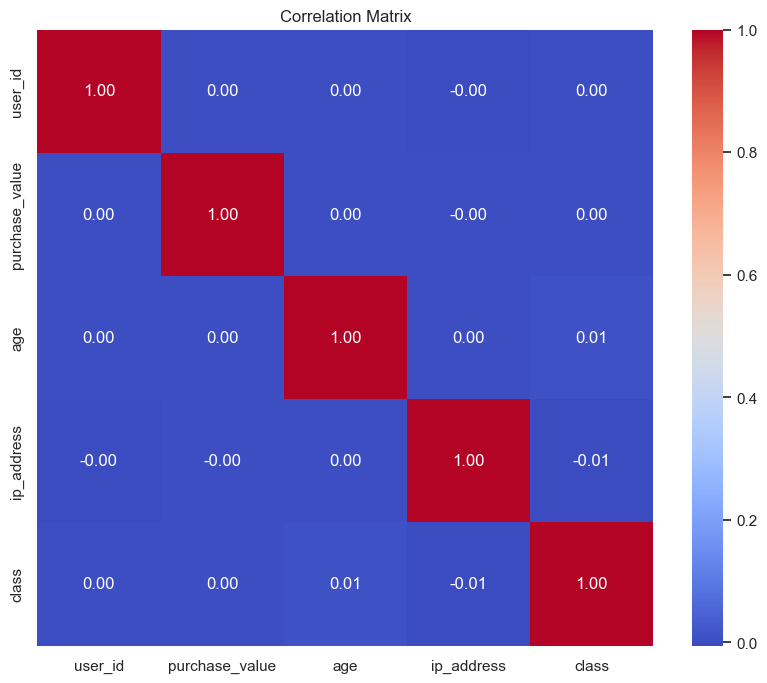

In [ ]:

# ===============================
# Bivariate Analysis
# ===============================
numeric_cols = Fraud_df.select_dtypes(include=['int64', 'float64']).columns
# 1. Numerical vs Numerical (Correlation matrix)
plt.figure(figsize=(10, 8))
corr = Fraud_df[numeric_cols].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title('Correlation Matrix')
plt.show()


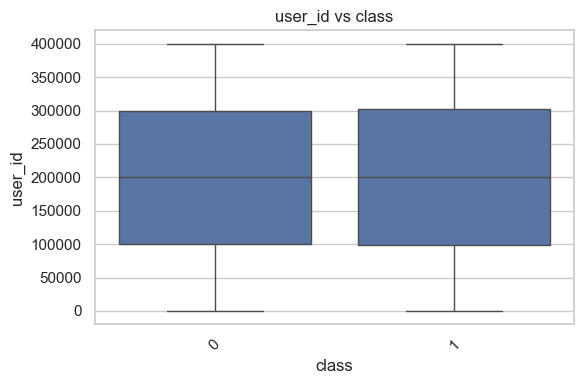

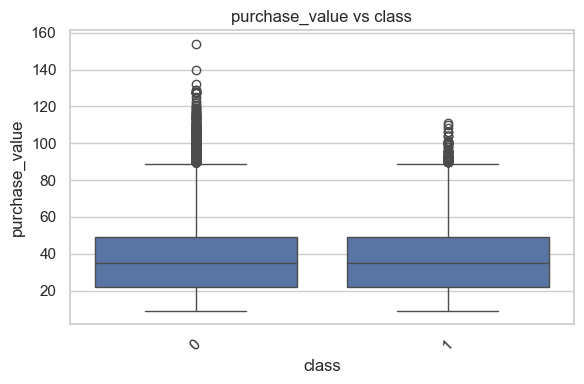

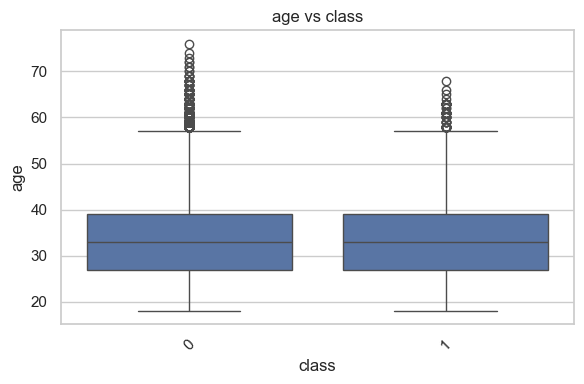

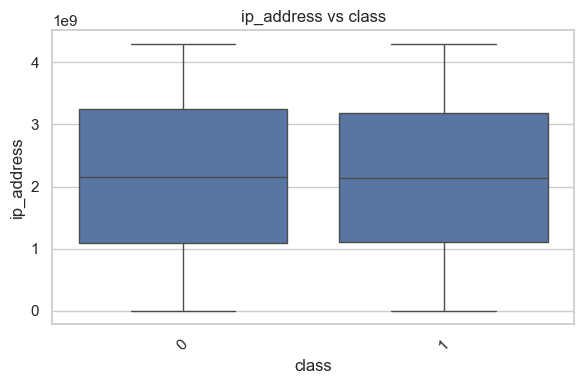

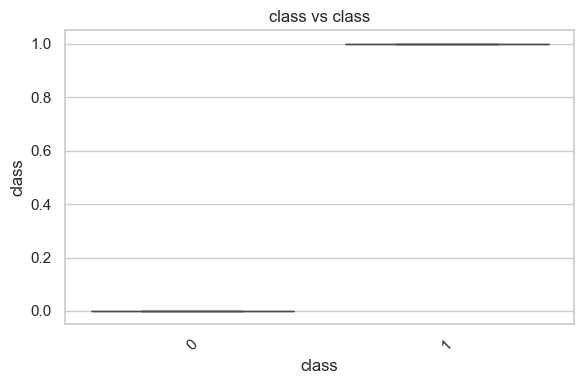

In [ ]:

# 2. Numerical vs Categorical (Boxplots)
# Replace 'target_col' with your categorical variable
if 'class' in Fraud_df.columns:
    for col in numeric_cols:
        plt.figure(figsize=(6, 4))
        sns.boxplot(data=Fraud_df, x='class', y=col)
        plt.title(f'{col} vs class')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()


In [ ]:

# 3. Categorical vs Categorical (Cross-tab)
if len(categorical_cols) >= 2:
    print(pd.crosstab(Fraud_df[categorical_cols[0]], Fraud_df[categorical_cols[1]]))
    sns.heatmap(pd.crosstab(Fraud_df[categorical_cols[0]], Fraud_df[categorical_cols[1]]), annot=True, fmt='d', cmap='YlGnBu')
    plt.title(f'{categorical_cols[0]} vs {categorical_cols[1]}')
    plt.tight_layout()
    plt.show()


C:\Users\user\AppData\Local\Temp\ipykernel_17428\4203120714.py:3: PerformanceWarning: The following operation may generate 22769405048 cells in the resulting pandas object.
  print(pd.crosstab(Fraud_df[categorical_cols[0]], Fraud_df[categorical_cols[1]]))


MemoryError: Unable to allocate 21.2 GiB for an array with shape (22769405048,) and data type bool